# Basic Cell Clustering Using 100Kb Bins

## Content

Here we go through the basic steps to perform cell clustering using genome non-overlapping 100Kb bins as features.
We start from raw methylation base count data stored in MCDS format.
This notebook can be used to quickly evaluate cell-type composition in a single-cell methylome dataset
(e.g., the dataset from a single experiment).

### Dataset used in this notebook
- Adult (age P56) male mouse brain hippocampus (HIP) snmC-seq2 data from {cite}`Liu2021`.

## Input
- MCDS files (contains chrom100k count matrix)
- Cell metadata

## Output
- Cell-by-100kb-bin AnnData with embedding coordinates and cluster labels.

## Import

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

from ALLCools.mcds import MCDS
from ALLCools.clustering import tsne, significant_pc_test, log_scale
from ALLCools.plot import *

## Parameters

In [2]:
# change this to the path to your metadata
metadata_path = '../../data/Brain/snmC-seq2/HIP.CellMetadata.csv.gz'

# Basic filtering parameters. 
# These are suggesting values, cutoff maybe different for different tissue and sequencing depths.
# To determine each cutoff more appropriately, one need to plot the distribution of each metric.
mapping_rate_cutoff = 0.5
mapping_rate_col_name = 'MappingRate'  # Name may change
final_reads_cutoff = 500000
final_reads_col_name = 'FinalReads'  # Name may change
mccc_cutoff = 0.03
mccc_col_name = 'mCCCFrac'  # Name may change
mch_cutoff = 0.2
mch_col_name = 'mCHFrac'  # Name may change
mcg_cutoff = 0.5
mcg_col_name = 'mCGFrac'  # Name may change

# change this to the paths to your MCDS files, 
# ALLCools.MCDS can handle multiple MCDS files automatically
mcds_path = '../../data/Brain/snmC-seq2/Liu2021Nature.mcds/'

# Dimension name used to do clustering
# This corresponding to AnnData .obs and .var
obs_dim = 'cell'  # observation
var_dim = 'chrom100k'  # feature

# feature cov cutoffs
min_cov = 500
max_cov = 3000

# Regions to remove during the clustering analysis
# change this to the path to ENCODE blacklist.
# The ENCODE blacklist can be downloaded from https://github.com/Boyle-Lab/Blacklist/
black_list_path = '../../data/genome/mm10-blacklist.v2.bed.gz'
black_list_fraction = 0.2
exclude_chromosome = ['chrM', 'chrY']

# load to memory or not
load = True

# HVF
mch_pattern = 'CHN'
mcg_pattern = 'CGN'
n_top_feature = 20000

# PC cutoff
pc_cutoff = 0.1

# KNN
knn = -1  # -1 means auto determine

# Leiden
resolution = 1

## Load Cell Metadata

In [3]:
metadata = pd.read_csv(metadata_path, index_col=0)
print(f'Metadata of {metadata.shape[0]} cells')
metadata.head()

Metadata of 16985 cells


,AllcPath,mCCCFrac,mCGFrac,mCGFracAdj,mCHFrac,mCHFracAdj,FinalReads,InputReads,MappedReads,DissectionRegion,BamFilteringRate,MappingRate,Plate,Col384,Row384,FANSDate,Slice,Sample
10E_M_0,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.008198,0.822633,0.821166,0.041640,0.033718,1626504.0,4407752,2892347.0,10E,0.562347,0.656195,CEMBA190625-10E-1,0,0,190625,10,10E_190625
10E_M_1,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.006019,0.743035,0.741479,0.024127,0.018218,2009998.0,5524084,3657352.0,10E,0.549577,0.662074,CEMBA190625-10E-1,0,1,190625,10,10E_190625
10E_M_10,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.006569,0.750172,0.748520,0.027665,0.021235,1383636.0,3455260,2172987.0,10E,0.636744,0.628892,CEMBA190625-10E-1,19,0,190625,10,10E_190625
10E_M_101,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.006353,0.760898,0.759369,0.026547,0.020323,2474670.0,7245482,4778768.0,10E,0.517847,0.659551,CEMBA190625-10E-1,18,3,190625,10,10E_190625
10E_M_102,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.005409,0.752980,0.751637,0.019497,0.014164,2430290.0,7004754,4609570.0,10E,0.527227,0.658063,CEMBA190625-10E-1,19,2,190625,10,10E_190625


## Filter Cells

In [4]:
judge = (metadata[mapping_rate_col_name] > mapping_rate_cutoff) & \
        (metadata[final_reads_col_name] > final_reads_cutoff) & \
        (metadata[mccc_col_name] < mccc_cutoff) & \
        (metadata[mch_col_name] < mch_cutoff) & \
        (metadata[mcg_col_name] > mcg_cutoff)

metadata = metadata[judge].copy()
print(f'{metadata.shape[0]} cells passed filtering')

16985 cells passed filtering


In [5]:
# Save
# metadata.to_csv('Brain.CellMetadata.PassQC.csv.gz')

## Load MCDS

In [6]:
mcds = MCDS.open(
    mcds_path, 
    obs_dim='cell', 
    var_dim='chrom100k',
    use_obs=metadata.index  # MCDS contains all cells, this will select cells that passed filtering 
)
total_feature = mcds.get_index(var_dim).size
mcds

<xarray.MCDS>
Dimensions:              (cell: 16985, chrom100k: 27269, count_type: 2, mc_type: 2)
Coordinates:
  * cell                 (cell) <U10 '10E_M_207' '10E_M_338' ... '9J_M_2969'
  * chrom100k            (chrom100k) int64 0 1 2 3 4 ... 27265 27266 27267 27268
    chrom100k_bin_end    (chrom100k) int64 dask.array<chunksize=(27269,), meta=np.ndarray>
    chrom100k_bin_start  (chrom100k) int64 dask.array<chunksize=(27269,), meta=np.ndarray>
    chrom100k_chrom      (chrom100k) <U5 dask.array<chunksize=(27269,), meta=np.ndarray>
  * count_type           (count_type) <U3 'mc' 'cov'
  * mc_type              (mc_type) <U3 'CGN' 'CHN'
    strand_type          <U4 'both'
Data variables:
    chrom100k_da         (cell, chrom100k, mc_type, count_type) uint16 dask.array<chunksize=(3397, 2479, 2, 2), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  chrom100k

In [7]:
# you can add the cell metadata into MCDS
mcds.add_cell_metadata(metadata)

## Filter Features

Feature chrom100k mean cov across cells added in MCDS.coords['chrom100k_cov_mean'].


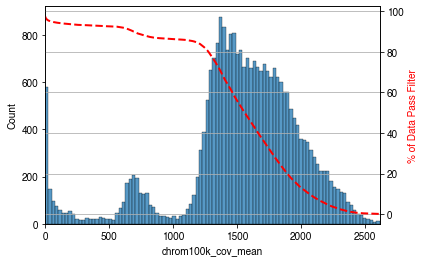

In [8]:
mcds.add_feature_cov_mean(var_dim=var_dim)

We saw three parts here with coverages from low to high, including:
1. Low coverage regions
2. chrX regions, because this dataset from male mouse brain
3. Other autosomal regions

In [9]:
# filter by coverage - based on the distribution above
mcds = mcds.filter_feature_by_cov_mean(
    min_cov=min_cov,  # minimum coverage
    max_cov=max_cov  # maximum coverage
)

# remove blacklist regions
mcds = mcds.remove_black_list_region(
    black_list_path=black_list_path,
    f=black_list_fraction  # Features having overlap > f with any black list region will be removed.
)

# remove chromosomes
mcds = mcds.remove_chromosome(exclude_chromosome)

Before cov mean filter: 27269 chrom100k
 After cov mean filter: 25242 chrom100k 92.6%
1189 chrom100k features removed due to overlapping (bedtools intersect -f 0.2) with black list regions.
20 chrom100k features in ['chrM', 'chrY'] removed.


## Calculate Feature mC Fractions

In [11]:
mcds.add_mc_frac(
normalize_per_cell=True,  # after calculating mC frac, per cell normalize the matrix
    clip_norm_value=10  # clip outlier values above 10 to 10
)

# load only the mC fraction matrix into memory so following steps is faster
# Only load into memory when your memory size is enough to handle your dataset
if load and (mcds.get_index(obs_dim).size < 20000):
    mcds[f'{var_dim}_da_frac'].load()

/home/hanliu/miniconda3/envs/allcools_new/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


The RuntimeWarning is expected (due to cov == 0). You can ignore it.

## Select Highly Variable Features (HVF)

### mCH HVF

In [12]:
mch_hvf = mcds.calculate_hvf_svr(var_dim=var_dim,
                                 mc_type=mch_pattern,
                                 n_top_feature=n_top_feature,
                                 plot=True)

Fitting SVR with gamma 0.0416, predicting feature dispersion using mc_frac_mean and cov_mean.
Total Feature Number:     24045
Highly Variable Feature:  20000 (83.2%)


### mCG HVF

In [13]:
mcg_hvf = mcds.calculate_hvf_svr(var_dim=var_dim,
                                 mc_type=mcg_pattern,
                                 n_top_feature=n_top_feature,
                                 plot=True)

Fitting SVR with gamma 0.0416, predicting feature dispersion using mc_frac_mean and cov_mean.
Total Feature Number:     24045
Highly Variable Feature:  20000 (83.2%)


## Get cell-by-feature mC fraction AnnData

In [14]:
mch_adata = mcds.get_adata(mc_type=mch_pattern,
                           var_dim=var_dim,
                           select_hvf=True)
mch_adata

AnnData object with n_obs × n_vars = 16985 × 20000
    obs: 'AllcPath', 'mCCCFrac', 'mCGFrac', 'mCGFracAdj', 'mCHFrac', 'mCHFracAdj', 'FinalReads', 'InputReads', 'MappedReads', 'DissectionRegion', 'BamFilteringRate', 'MappingRate', 'Plate', 'Col384', 'Row384', 'FANSDate', 'Slice', 'Sample'
    var: 'bin_end', 'bin_start', 'chrom', 'cov_mean', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select'

In [15]:
mcg_adata = mcds.get_adata(mc_type=mcg_pattern,
                           var_dim=var_dim,
                           select_hvf=True)
mcg_adata

AnnData object with n_obs × n_vars = 16985 × 20000
    obs: 'AllcPath', 'mCCCFrac', 'mCGFrac', 'mCGFracAdj', 'mCHFrac', 'mCHFracAdj', 'FinalReads', 'InputReads', 'MappedReads', 'DissectionRegion', 'BamFilteringRate', 'MappingRate', 'Plate', 'Col384', 'Row384', 'FANSDate', 'Slice', 'Sample'
    var: 'bin_end', 'bin_start', 'chrom', 'cov_mean', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select'

## Scale

In [16]:
log_scale(mch_adata)

StandardScaler(with_mean=False)

In [17]:
log_scale(mcg_adata)

StandardScaler(with_mean=False)

## PCA

### mCH PCA

47 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (16985, 50) to (16985, 47)
Red axis labels are used PCs


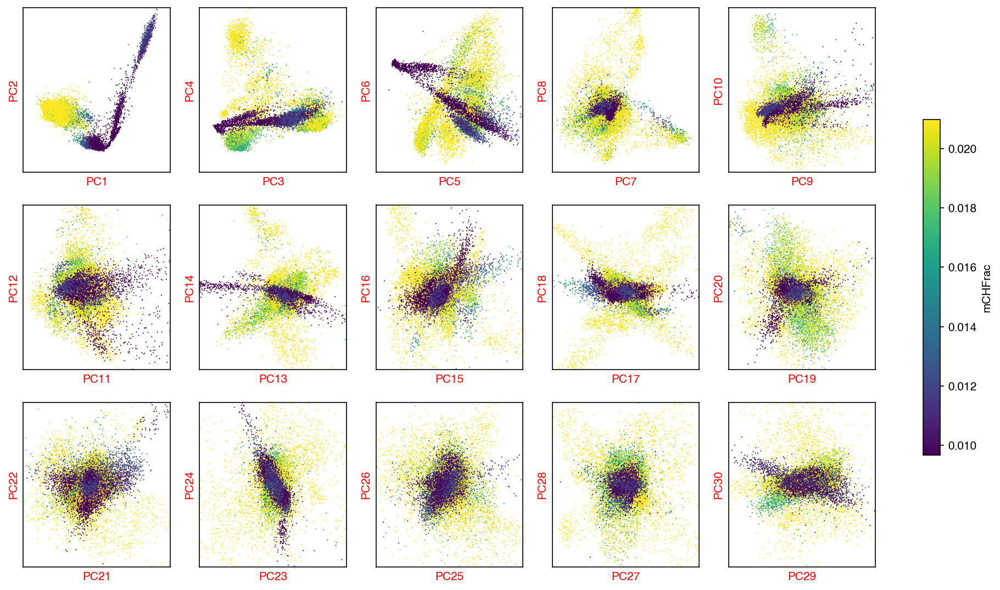

In [18]:
sc.tl.pca(mch_adata)
ch_n_components = significant_pc_test(mch_adata)
fig, axes = plot_decomp_scatters(mch_adata,
                                 n_components=ch_n_components,
                                 hue=mch_col_name,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=3,
                                 ncols=5)

### mCG PCA

23 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (16985, 50) to (16985, 23)
Red axis labels are used PCs


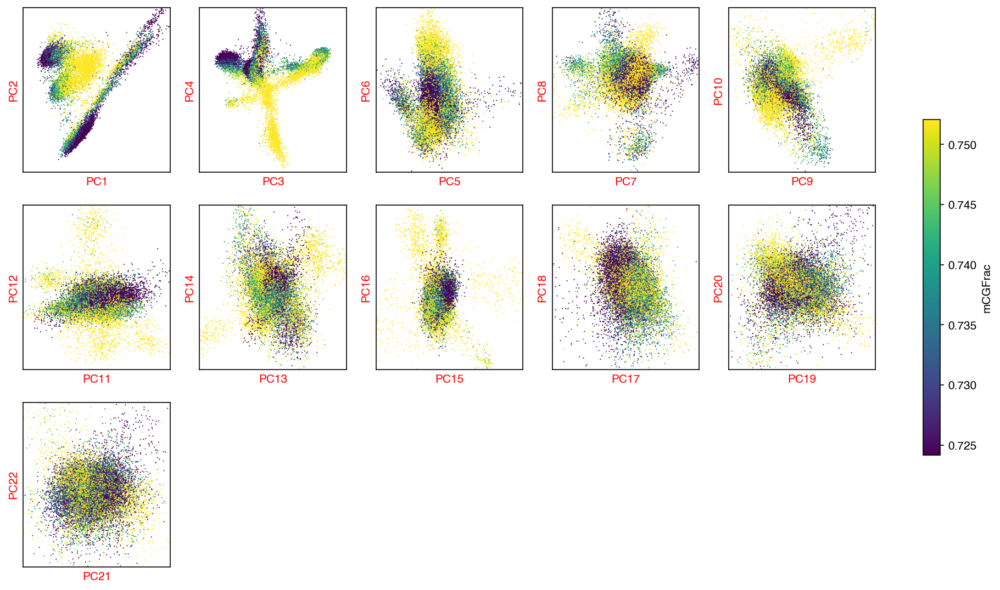

In [19]:
sc.tl.pca(mcg_adata)
cg_n_components = significant_pc_test(mcg_adata)
fig, axes = plot_decomp_scatters(mcg_adata,
                                 n_components=cg_n_components,
                                 hue=mcg_col_name,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=3,
                                 ncols=5)

### Concatenate PCs

In [20]:
ch_pcs = mch_adata.obsm['X_pca'][:, :ch_n_components]
cg_pcs = mcg_adata.obsm['X_pca'][:, :cg_n_components]

# scale the PCs so CH and CG PCs has the same total var
cg_pcs = cg_pcs / cg_pcs.std()
ch_pcs = ch_pcs / ch_pcs.std()

# total_pcs
total_pcs = np.hstack([ch_pcs, cg_pcs])

# make a copy of adata, add new pcs
# this is suboptimal, will change this when adata can combine layer and X in the future
adata = mch_adata.copy()
adata.obsm['X_pca'] = total_pcs
del adata.uns['pca']
del adata.varm['PCs']

## Clustering

### Calculate Nearest Neighbors

In [21]:
if knn == -1:
    knn = max(15, int(np.log2(adata.shape[0])*2))
sc.pp.neighbors(adata, n_neighbors=knn)

### Leiden Clustering

In [22]:
sc.tl.leiden(adata, resolution=resolution)

## Manifold learning

### tSNE

In [24]:
tsne(adata,
     obsm='X_pca',
     metric='euclidean',
     exaggeration=-1,  # auto determined
     perplexity=30,
     n_jobs=-1)

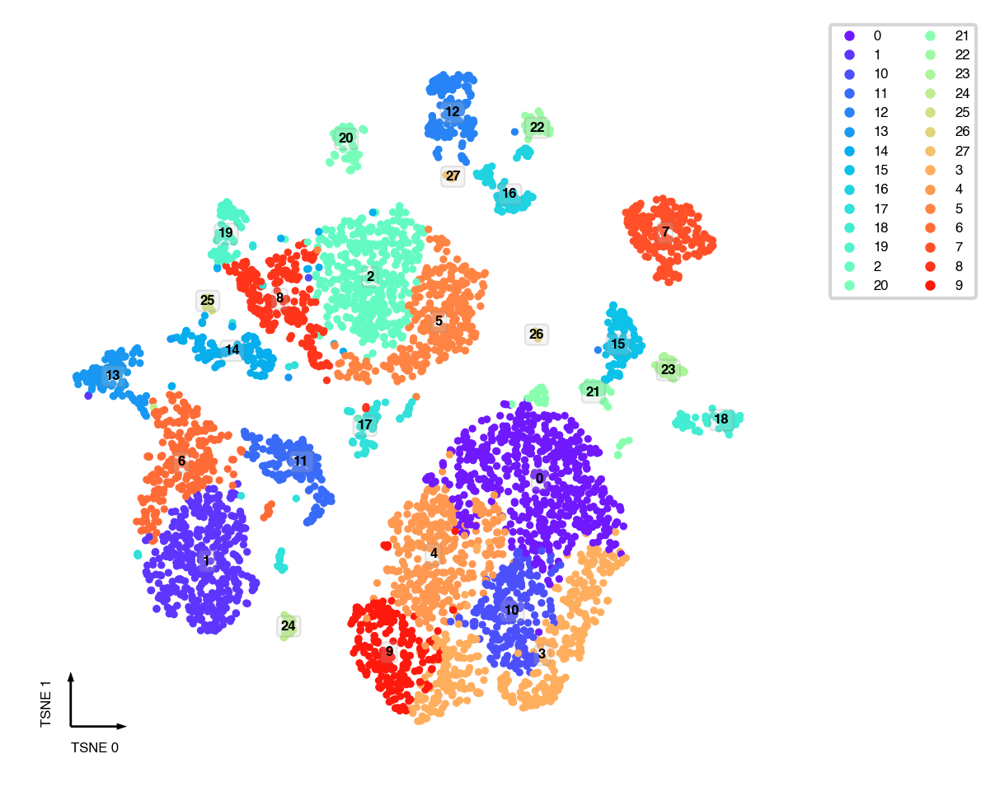

In [25]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata,
                        ax=ax,
                        coord_base='tsne',
                        hue='leiden',
                        text_anno='leiden',
                        show_legend=True)

### UMAP

In [26]:
sc.tl.umap(adata)

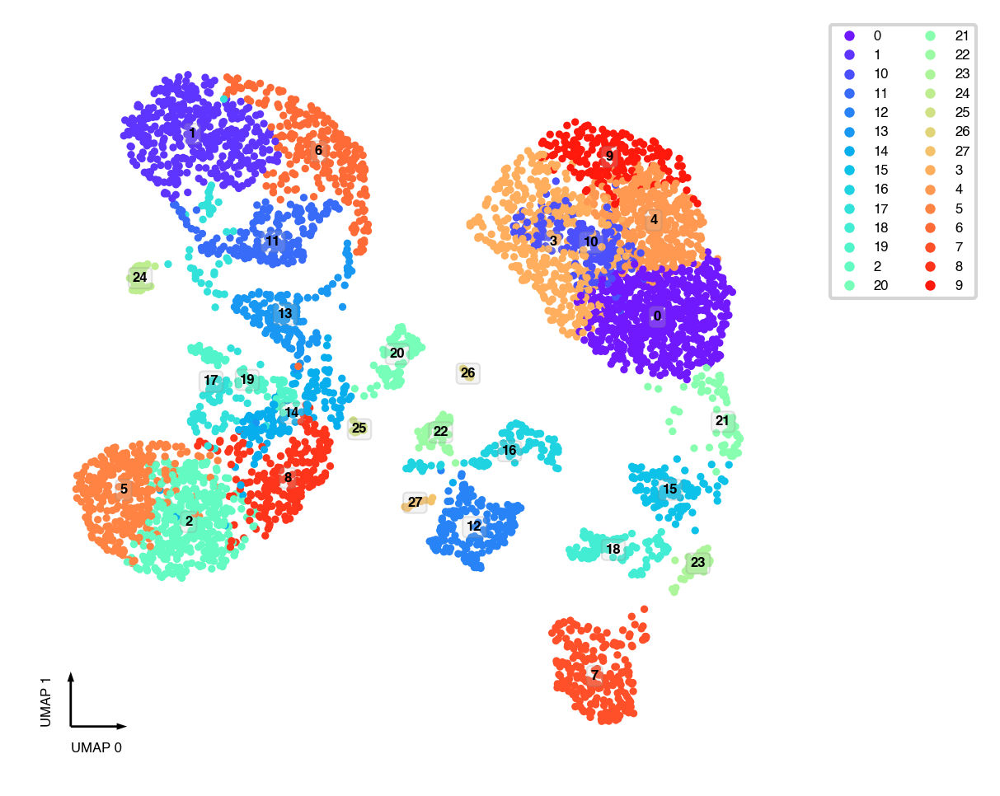

In [27]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        text_anno='leiden',
                        show_legend=True)

### Interactive plot

In [34]:
# in order to reduce the page size, I downsample the data here, you don't need to do this
interactive_scatter(data=adata,
                    hue='leiden',
                    coord_base='umap',
                    max_points=3000)

## Save Results

In [35]:
adata.write_h5ad('Brain.chrom100k-clustering.h5ad')
adata

/home/hanliu/miniconda3/envs/allcools_new/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning:

The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.

... storing 'DissectionRegion' as categorical
/home/hanliu/miniconda3/envs/allcools_new/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning:

The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.

... storing 'Plate' as categorical
/home/hanliu/miniconda3/envs/allcools_new/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning:

The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.

... 

AnnData object with n_obs × n_vars = 16985 × 20000
    obs: 'AllcPath', 'mCCCFrac', 'mCGFrac', 'mCGFracAdj', 'mCHFrac', 'mCHFracAdj', 'FinalReads', 'InputReads', 'MappedReads', 'DissectionRegion', 'BamFilteringRate', 'MappingRate', 'Plate', 'Col384', 'Row384', 'FANSDate', 'Slice', 'Sample', 'leiden'
    var: 'bin_end', 'bin_start', 'chrom', 'cov_mean', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select'
    uns: 'log', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'

In [36]:
adata.obs.to_csv('Brain.ClusteringResults.csv.gz')
adata.obs.head()

,AllcPath,mCCCFrac,mCGFrac,mCGFracAdj,mCHFrac,mCHFracAdj,FinalReads,InputReads,MappedReads,DissectionRegion,BamFilteringRate,MappingRate,Plate,Col384,Row384,FANSDate,Slice,Sample,leiden
cell,,,,,,,,,,,,,,,,,,,
10E_M_207,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.006059,0.791481,0.790210,0.024853,0.018908,1394119.0,3382862,2208361.0,10E,0.631291,0.652808,CEMBA190625-10E-2,20,4,190625,10,10E_190625,14
10E_M_338,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.005151,0.738883,0.737531,0.017620,0.012533,1623613.0,3930932,2616811.0,10E,0.620455,0.665697,CEMBA190625-10E-1,9,6,190625,10,10E_190625,14
10E_M_410,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.005322,0.741459,0.740076,0.017949,0.012695,1698314.0,4325806,2883026.0,10E,0.589073,0.666471,CEMBA190625-10E-1,3,9,190625,10,10E_190625,8
10E_M_426,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.005194,0.729766,0.728355,0.017188,0.012057,1830508.0,4893582,3245794.0,10E,0.563963,0.663276,CEMBA190625-10E-1,7,9,190625,10,10E_190625,14
10E_M_431,/gale/raidix/rdx-4/mapping/10E/CEMBA190625-10E...,0.006075,0.756491,0.755003,0.023721,0.017754,1585419.0,4273210,2838002.0,10E,0.558639,0.664138,CEMBA190625-10E-1,8,8,190625,10,10E_190625,14


## Sanity test

This test dataset come from {cite:p}`Liu2021`, so we already annotated the cell types. For new datasets, see following notebooks about identifying cluster markers and annotate clusters

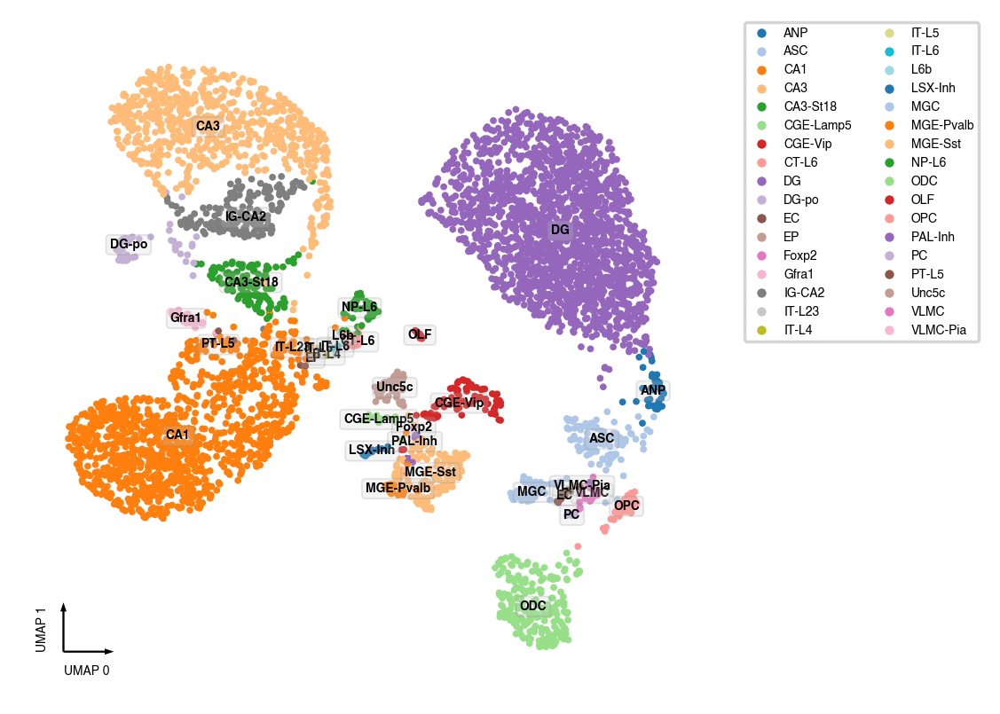

In [40]:
try:
    cell_anno = pd.read_csv('../../data/Brain/snmC-seq2/HIP.Annotated.CellMetadata.csv.gz', index_col=0)
    fig, ax = plt.subplots(figsize=(4, 4), dpi=250)
    adata.obs['CellTypeAnno'] = cell_anno['MajorType']
    adata.obs['CellTypeAnno'].fillna('nan', inplace=True)
    _ = categorical_scatter(data=adata,
                            ax=ax,
                            coord_base='umap',
                            hue='CellTypeAnno',
                            text_anno='CellTypeAnno',
                            palette='tab20',
                            show_legend=True)
except BaseException:
    pass

In [41]:
# this cell will not occur in the documentation
import subprocess
subprocess.run('rm -f Brain.ClusteringResults.csv.gz Brain.chrom100k-clustering.h5ad', shell=True)

CompletedProcess(args='rm -f Brain.ClusteringResults.csv.gz Brain.chrom100k-clustering.h5ad', returncode=0)